# Plotting in Julia

Visualizing data is a key tool in data science. Julia has several visualization options available.
In this course, we'll use the Julia package `Plots.jl`. it provides a flexible syntax for plotting, in which options to change attributes like the width of the lines used in the figure are given as named keyword arguments.

In addition, it allows us to use different "backends", which are the other libraries that actually carry out the plotting following the instructions from `Plots.jl`.

We'll start out by loading `Plots.jl`:

In [2]:
using Plots

By default, it uses the "GR" backend. We can get back to using that backend at any time by executing

In [3]:
gr()

Plots.GRBackend()

## Lines and dots

Later on in the course, we'll use real data, but for now let's make up some noisy data:

In [11]:
xs = -5:0.01:5
ys = sin.(xs) .+ 0.5*rand(length(xs));

To draw the curve given by these $x$ and $y$ coordinates, we do 

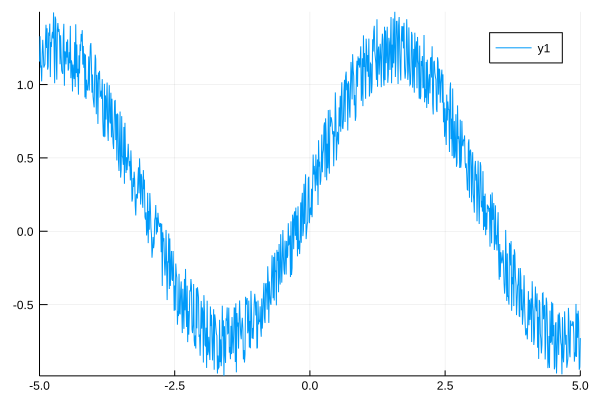

In [12]:
plot(xs, ys)

We can draw them with points instead using

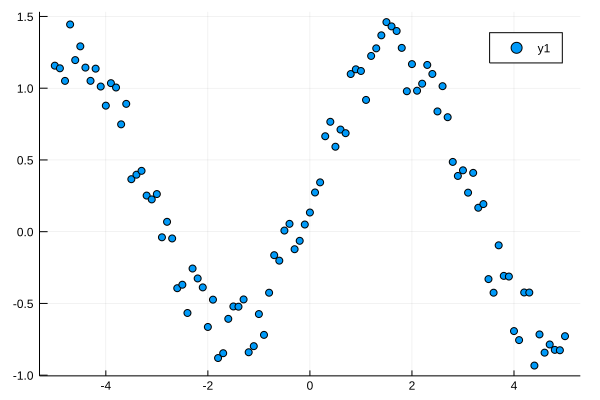

In [13]:
scatter(xs[1:10:end], ys[1:10:end])

Here we sampled the data to only draw every 10th point.

We can get points and lines together:

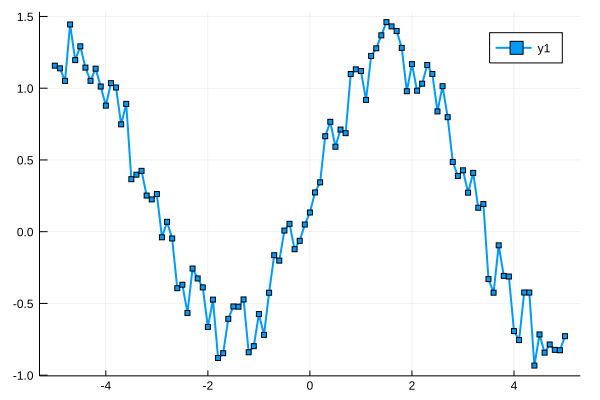

In [19]:
plot(xs[1:10:end], ys[1:10:end], m=:square, ms=2, lw=2)

Here we used **keyword arguments** to set the `marker` (abbreviation `m`) and `markersize` (abbreviation `ms`), as well as the `linewidth` (`lw`).

We can add labels to the axis and a title, and a label for the curve:

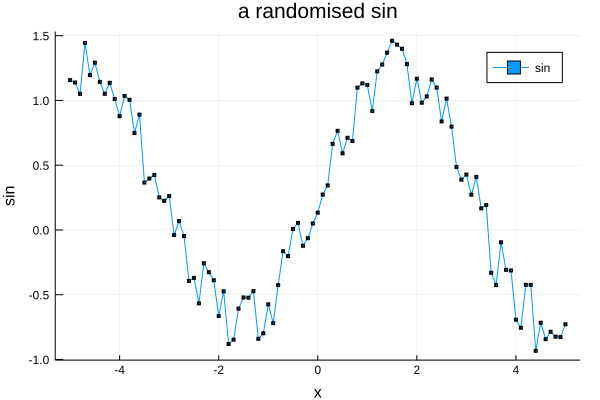

In [16]:
plot(xs[1:10:end], ys[1:10:end], m=:square, ms=1, label="sin")
xlabel!("x")
ylabel!("sin")
title!("a randomised sin")

## Two curves on a single plot

Suppose we define some more data `zs`:

In [25]:
zs = cos.(xs) .+ 0.5*rand(length(xs));

Let's try to draw the two graphs on the same figure:

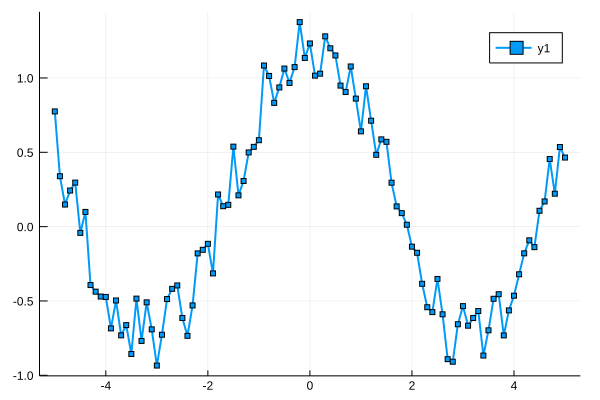

In [26]:
plot(xs[1:10:end], ys[1:10:end], m=:square, ms=2, lw=2)
plot(xs[1:10:end], zs[1:10:end], m=:square, ms=2, lw=2)

We only see the second graph, which replaced the first one. We can use `display` to draw them consecutively:

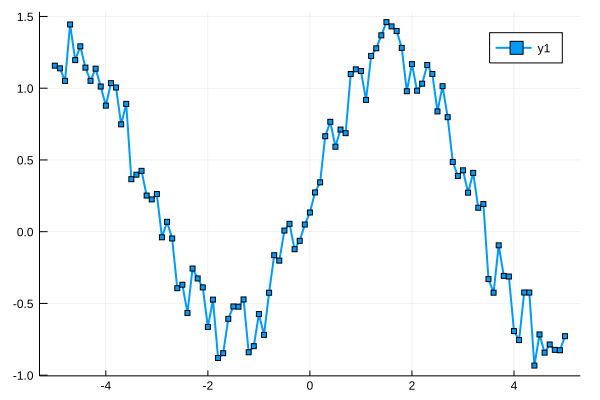

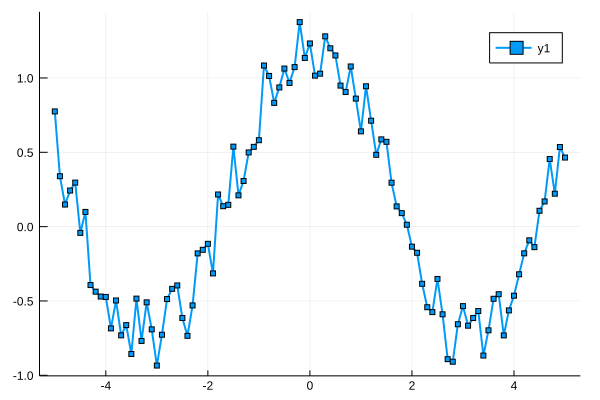

In [27]:
display( plot(xs[1:10:end], ys[1:10:end], m=:square, ms=2, lw=2), label="sin")
display( plot(xs[1:10:end], zs[1:10:end], m=:square, ms=2, lw=2), label="cos" )

To draw them on the same graph, we modify the second `plot` command to have a `!` after the plot command:

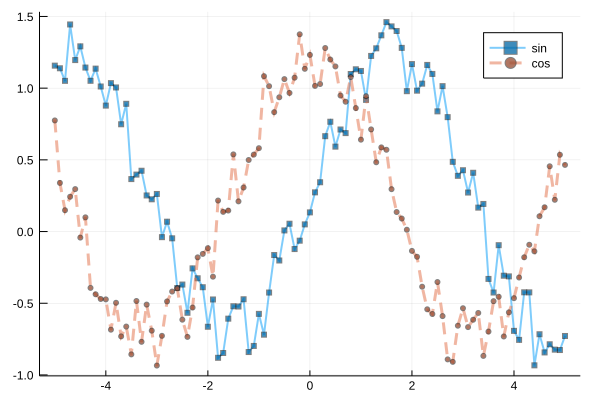

In [36]:
plot(xs[1:10:end], ys[1:10:end], m=:square, ms=2, lw=2, label="sin", alpha=0.5)
plot!(xs[1:10:end], zs[1:10:end], m=:circle, ms=3, lw=3, label="cos", ls=:dash, alpha=0.5) 

In general, a `!` should be added to each plotting command to overlay the plot on what is already existing.
Here we also changed the line style with the `ls` keyword, and added transparency with the `alpha` keyword.

## Plotting in a loop

Suppose we have a sequence of plots to plot with a `for` loop. Until now, we have used the fact that Julia returns the last object manipulated to automatically plot a graph. However, a `for` loop does not return anything, so to display the plot we first make an empty plot and assign it to a variable, and return that variable at the end of the loop:

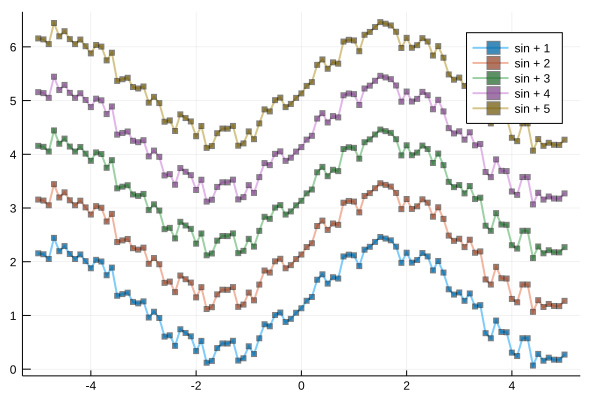

In [39]:
p = plot()

for i in 1:5
    plot!(xs[1:10:end], ys[1:10:end] .+ i, m=:square, ms=2, lw=2, label="sin + $i", alpha=0.5)
end

p

Here we used string interpolation in each plot label to distinguish the plots.

## Interactive animation

We can make an interactive visualization or animation by adding a slider to change a parameter. For example, let's add a parameter to move the plot up and down. We use a `for` similar to the previous section, but now just return the plot object from the body of the `for`, and wrap it in `@manipulate` from the `Interact.jl` package:

In [41]:
using Interact

Interact.Options{:SelectionSlider,Int64}(9: "input-3" = 3 Int64 , "i", 3, "3", 3, Interact.OptionDict(DataStructures.OrderedDict("1"=>1,"2"=>2,"3"=>3,"4"=>4,"5"=>5), Dict(4=>"4",2=>"2",3=>"3",5=>"5",1=>"1")), Any[], Any[], true, "horizontal", true)

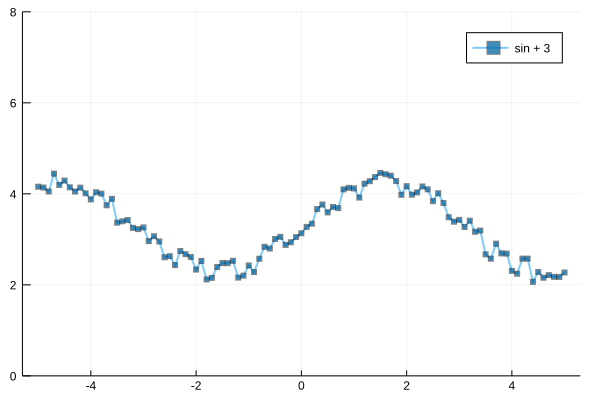

In [44]:
@manipulate for i in 1:5
    plot(xs[1:10:end], ys[1:10:end] .+ i, m=:square, ms=2, lw=2, label="sin + $i", alpha=0.5)
    ylims!(0, 8)
end

Here, we fixed the limits of the plot in the direction `y` using `ylims!`.

## Plotting functions

So far we have plotted data. Sometimes we wish to plot functions. We do not need to sample the function; we just give the $x$ range where we would like to plot it. E.g. let's compare the data to the `sin` function:

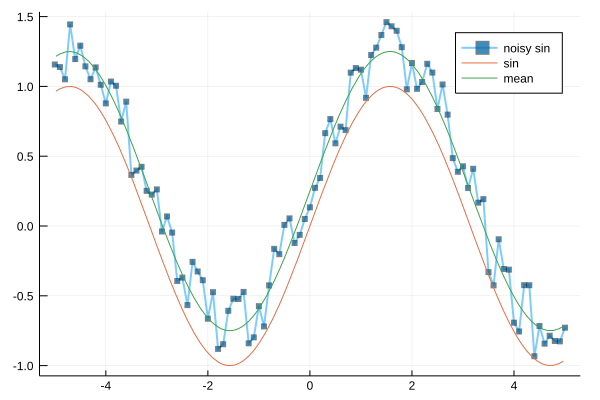

In [56]:
plot(xs[1:10:end], ys[1:10:end], m=:square, ms=2, lw=2, label="noisy sin", alpha=0.5)
plot!(sin, -5.0, 5.0, label="sin")
plot!(x->sin(x)+0.25, -5.0, 5.0, label="mean")

# Changing the aspect ratio

Often it is better to have equal distances in $x$ and $y$ appear equal on the graph. This is done by fixing the so-called **aspect ratio**:

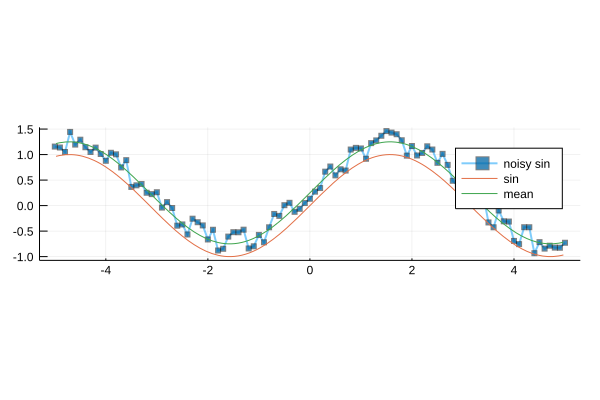

In [62]:
plot!(aspect_ratio=1)

## Saving figures

Once we have a figure, we can save it with 

In [59]:
savefig("sines.pdf")

The termination of the filename (here `.pdf`) will determine the file format of the file that is written. Usually we want to use a "vector" format like PDF, which records instructions for how to draw the figure, rather than a bitmap format like PNG, which just stores a snapshot of the figure at a fixed resolution.

## Functions of two variables

We will need to plot functions of two variables. For example, suppose we have the function

In [61]:
f(x, y) = x^2 + 2y^2

f (generic function with 1 method)

We can plot it as a surface by giving the range in $x$ and $y$ and using the `surface` command:

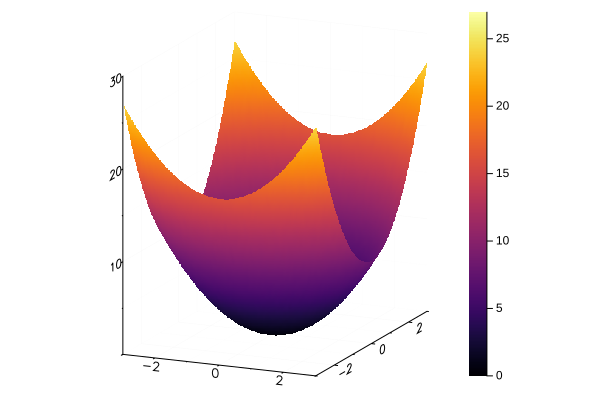

In [64]:
surface(-3:0.1:3, -3:0.1:3, f)

## Making it interactive

There is one problem with this figure: it is not interactive. We would like to be able to rotate it! We could do this with `Interact.jl` and specify the viewpoint, but it is easier to use a different "backend" that includes this by default, namely `PlotlyJS`. We load this with:

In [65]:
plotlyjs()

Plots.PlotlyJSBackend()

But don't worry, `Plots.jl` allows us to use exactly the same syntax!

In [71]:
surface(-3:0.1:3, -3:0.1:3, f, alpha=0.8)

You should now be able to rotate the plot with the mouse and zoom in and out!

## Contours

An alternative way of visualizing functions of two variables, which is often more useful, is via **contours**, or **isolines**, i.e. lines in the $x$--$y$ plane where the function takes a certain value:

In [82]:
plotlyjs()
contour(-3:0.01:3, -3:0.01:3, f, aspect_ratio=1)

In [79]:
gr()

Plots.GRBackend()

With GR, you can specify exactly which contour levels to draw:

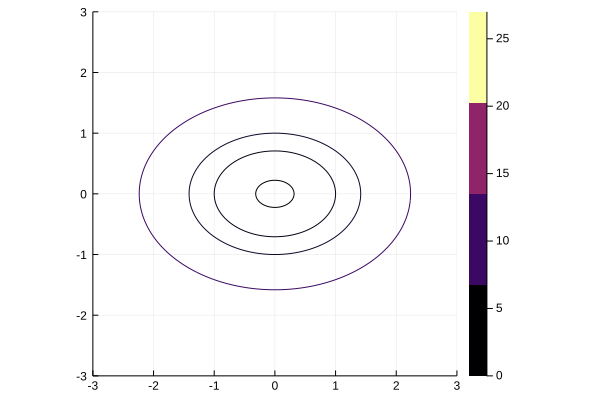

In [84]:
gr()
contour(-3:0.01:3, -3:0.01:3, f, levels=[0.1, 1, 2, 5], aspect_ratio=1)

Note that it is not currently possible to do so with PlotlyJS.